In [ ]:
# Import necessary libraries
import os
import tarfile
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from tensorflow.keras import layers, models
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import tensorflow as tf
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization
from tensorflow.keras.callbacks import ReduceLROnPlateau
from tensorflow.keras.regularizers import l2

In [ ]:
# Check for GPU availability

# make a list
is_cuda_available = tf.config.list_physical_devices('GPU')
if is_cuda_available:
    print("GPU Available")
else:
    print("GPU not available")
device = 'GPU' if is_cuda_available else 'CPU'
print(f"Using device: {device}")

GPU Available
Using device: GPU


In [ ]:
# Enable GPU and mixed precision for faster training
mixed_precision = tf.keras.mixed_precision.Policy('mixed_float16') # float16 - lower precision, faster (weights and computation) | float32 - higher precision, more accurate (loss and gradients)
tf.keras.mixed_precision.set_global_policy(mixed_precision)
tf.config.optimizer.set_jit(True)  # Enable XLA - optimizes tensorflow operations, reduce memory and speeds up execution

In [ ]:
# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Paths for dataset
images_tar_path = "/content/drive/MyDrive/Computer Vision/Final/database/images.tar.gz"
annotations_tar_path = "/content/drive/MyDrive/Computer Vision/Final/database/annotations.tar.gz"

# Extract dataset and create directory
os.makedirs("./images", exist_ok=True)
os.makedirs("./annotations", exist_ok=True)

with tarfile.open(images_tar_path, "r:gz") as tar:
    tar.extractall(path="./images")

with tarfile.open(annotations_tar_path, "r:gz") as tar:
    tar.extractall(path="./annotations")

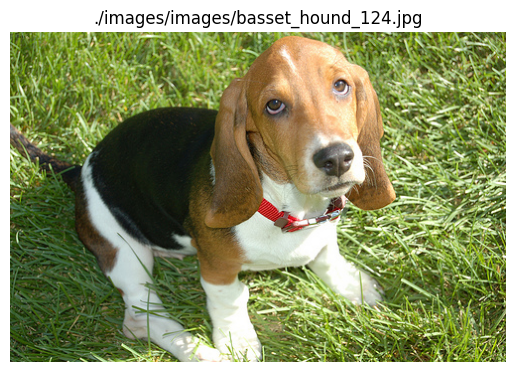

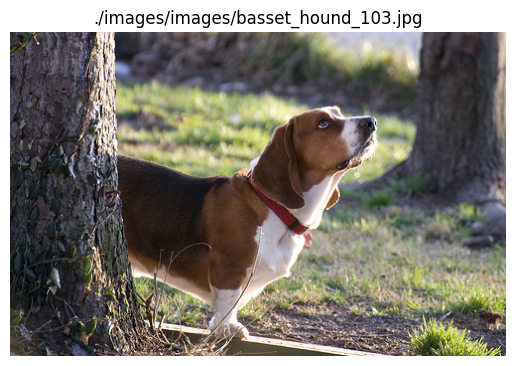

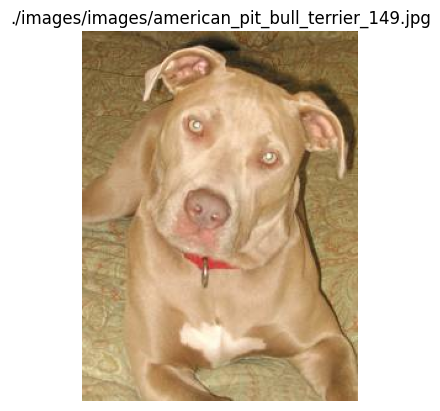

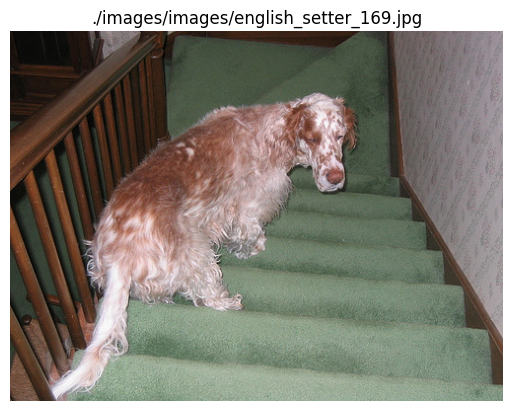

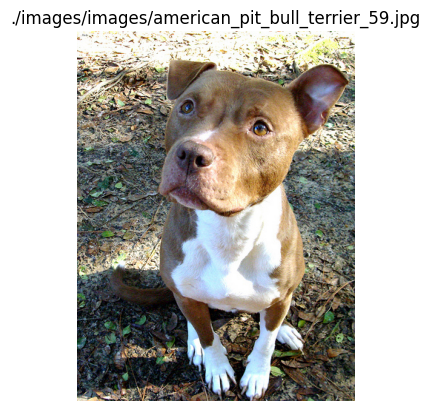

In [ ]:
import cv2

image_dir = "./images/images"
image_files = [os.path.join(image_dir, file) for file in os.listdir(image_dir) if file.endswith('.jpg')]

# Display the first 5 images
for img_file in image_files[:5]:
    # Read the image using OpenCV
    img = cv2.imread(img_file) # BGR format default
    # Convert the image from BGR to RGB cause of matplot
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    # Display the image
    plt.imshow(img_rgb)
    plt.title(img_file)
    plt.axis("off")
    plt.show()

In [ ]:
# Put annotations and prepare labels
annotations_path = "./annotations/annotations/list.txt"
labels_dict = {}

with open(annotations_path, "r") as file:
    lines = file.readlines()[6:]  # Skip the first 6 lines cause that is the header in the file
    for line in lines:
        parts = line.strip().split()
        if len(parts) > 1:
            filename, label = parts[0], int(parts[1]) - 1  # Adjust the label so it starts from 0
            labels_dict[filename] = label # This stores it

# Assign labels to images
labels = [labels_dict.get(os.path.splitext(os.path.basename(file))[0], -1) for file in image_files] # extracts file name, removes .jpg, retrieves label and if no label = -1

# Split dataset into training and validation
train_files, val_files, train_labels, val_labels = train_test_split(
    image_files, labels, test_size=0.2, random_state=42 # 20% data for validation
)

# This will remove al labels with index = -1
filtered_train_files, filtered_train_labels = zip(*[(file, label) for file, label in zip(train_files, train_labels) if label != -1])
filtered_val_files, filtered_val_labels = zip(*[(file, label) for file, label in zip(val_files, val_labels) if label != -1])

# Convert labels to strings for categorical class mode
filtered_train_labels = [str(label) for label in filtered_train_labels]
filtered_val_labels = [str(label) for label in filtered_val_labels]

In [ ]:
# Prepare data generators
IMG_SIZE = (128, 128)
BATCH_SIZE = 32

train_datagen = ImageDataGenerator(
    rescale=1.0/255,
    rotation_range=30,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.3,
    horizontal_flip=True, # increase dataset diversity
    brightness_range=[0.8, 1.2],
    fill_mode="nearest"
)

val_datagen = ImageDataGenerator(
    rescale=1.0/255
    )

train_data = train_datagen.flow_from_dataframe(
    dataframe=pd.DataFrame({"filename": filtered_train_files, "class": filtered_train_labels}),
    x_col="filename",
    y_col="class",
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode="categorical"
)

val_data = val_datagen.flow_from_dataframe(
    dataframe=pd.DataFrame({"filename": filtered_val_files, "class": filtered_val_labels}),
    x_col="filename",
    y_col="class",
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode="categorical"
)

Found 5883 validated image filenames belonging to 37 classes.
Found 1466 validated image filenames belonging to 37 classes.


In [ ]:
# filter and kernel size
# Define the CNN model
model = models.Sequential([ # layers are stacked linearly
    layers.Conv2D(32, (3, 3), activation='relu', input_shape=(128, 128, 3)),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(128, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Flatten(), # 2D into 1D vector
    layers.Dense(128, activation='relu'), # applys weights
    #Dropout(0.5),
    layers.Dense(37, activation='softmax')  # 37 classes
])

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [ ]:
# reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5) #it will monitor the val_loss and if there is no improvement for 5 epochs, the lr will be reduced
# early_stopping = EarlyStopping(monitor='val_accuracy', patience=5, restore_best_weights=True)
# Compile the model
model.compile(
    optimizer='adam', # adjusts learning rates dynamically for faster convergence
    loss='categorical_crossentropy', # or sparse_categorical_crossentropy?
    metrics=['accuracy']
)

# Train the model for 200 epochs
history = model.fit(
    train_data,
    validation_data=val_data,
    epochs=200,
    verbose=1 # this will display val_accuracy and val_loss for every epoch
    #validation_split=0.2,
    #batch_size=32,
    #callbacks=[reduce_lr],
    #callbacks=[early_stopping]
)

# Save the model
model.save("/content/drive/MyDrive/Computer Vision/Final/try/model.h5")

# Evaluate the model
loss, accuracy = model.evaluate(val_data)
print(f"Validation Loss: {loss}")
print(f"Validation Accuracy: {accuracy}")

Epoch 1/200


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


184/184 ━━━━━━━━━━━━━━━━━━━━ 74s 323ms/step - accuracy: 0.0261 - loss: 3.6630 - val_accuracy: 0.0409 - val_loss: 3.5306
Epoch 2/200
184/184 ━━━━━━━━━━━━━━━━━━━━ 60s 266ms/step - accuracy: 0.0558 - loss: 3.5395 - val_accuracy: 0.0628 - val_loss: 3.4381
Epoch 3/200
184/184 ━━━━━━━━━━━━━━━━━━━━ 50s 264ms/step - accuracy: 0.0597 - loss: 3.4723 - val_accuracy: 0.0641 - val_loss: 3.3974
Epoch 4/200
184/184 ━━━━━━━━━━━━━━━━━━━━ 50s 262ms/step - accuracy: 0.0713 - loss: 3.4396 - val_accuracy: 0.0750 - val_loss: 3.3757
Epoch 5/200
184/184 ━━━━━━━━━━━━━━━━━━━━ 82s 265ms/step - accuracy: 0.0872 - loss: 3.3890 - val_accuracy: 0.1030 - val_loss: 3.2705
Epoch 6/200
184/184 ━━━━━━━━━━━━━━━━━━━━ 50s 262ms/step - accuracy: 0.0991 - loss: 3.3205 - val_accuracy: 0.1221 - val_loss: 3.2041
Epoch 7/200
184/184 ━━━━━━━━━━━━━━━━━━━━ 87s 286ms/step - accuracy: 0.1116 - loss: 3.2500 - val_accuracy: 0.1255 - val_loss: 3.2155
Epoch 8/200
184/184 ━━━━━━━━━━━━━━━━━━━━ 49s 259ms/step - accuracy: 0.1289 - loss: 3.182

46/46 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - accuracy: 0.4173 - loss: 2.6406
Validation Loss: 2.632317304611206
Validation Accuracy: 0.4263301491737366


In [ ]:
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping

In [ ]:
# Test with VGG16
# Early stopping for pre-trained models
early_stopping_vgg = EarlyStopping(monitor='val_accuracy', patience=5, restore_best_weights=True) #val_loss?
from tensorflow.keras.applications import VGG16
vgg16_base = VGG16(weights='imagenet', include_top=False, input_shape=(128, 128, 3)) # excludes FC layers on top
vgg16_base.trainable = False  # Freeze the base model so the pre-trained features are not altered during training

vgg16_model = models.Sequential([
    vgg16_base,
    #Flatten(),
    layers.GlobalAveragePooling2D(),
    layers.Dense(128, activation='relu'),
    #Dropout(0.5),
    layers.Dense(37, activation='softmax')
])

vgg16_model.compile(
    optimizer=Adam(learning_rate=1e-4), # to prevent drastic changes to the weights
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

vgg16_history = vgg16_model.fit(
    train_data,
    validation_data=val_data,
    epochs=100,
    callbacks=[early_stopping_vgg],
    verbose=1
)

# Save and evaluate VGG16 model
vgg16_model.save("/content/drive/MyDrive/Computer Vision/Final/try/vgg16_model.h5")
vgg16_loss, vgg16_accuracy = vgg16_model.evaluate(val_data)
print(f"VGG16 Validation Loss: {vgg16_loss}")
print(f"VGG16 Validation Accuracy: {vgg16_accuracy}")

58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 4s 0us/step
Epoch 1/100
184/184 ━━━━━━━━━━━━━━━━━━━━ 81s 368ms/step - accuracy: 0.0278 - loss: 3.6854 - val_accuracy: 0.0382 - val_loss: 3.5832
Epoch 2/100
184/184 ━━━━━━━━━━━━━━━━━━━━ 54s 285ms/step - accuracy: 0.0424 - loss: 3.5724 - val_accuracy: 0.0703 - val_loss: 3.5115
Epoch 3/100
184/184 ━━━━━━━━━━━━━━━━━━━━ 52s 273ms/step - accuracy: 0.0767 - loss: 3.5097 - val_accuracy: 0.0935 - val_loss: 3.4442
Epoch 4/100
184/184 ━━━━━━━━━━━━━━━━━━━━ 54s 278ms/step - accuracy: 0.1019 - loss: 3.4571 - val_accuracy: 0.1201 - val_loss: 3.3734
Epoch 5/100
184/184 ━━━━━━━━━━━━━━━━━━━━ 53s 279ms/step - accuracy: 0.1281 - loss: 3.3957 - val_accuracy: 0.1296 - val_loss: 3.3067
Epoch 6/100
184/184 ━━━━━━━━━━━━━━━━━━━━ 81s 277ms/step - accuracy: 0.1472 - loss: 3.3369 - val_accuracy: 0.1671 - val_loss: 3.2396
Epoch 7/100
184/184 ━━━━━━━━━━━━━━━━━━━━ 51s 269ms/step - accuracy: 0.1598 - loss: 3.2895 - val_accuracy: 0.1746 - val_loss: 3.1705
Epoch 8/100
184/184 ━━━━━

46/46 ━━━━━━━━━━━━━━━━━━━━ 4s 96ms/step - accuracy: 0.4161 - loss: 2.0912
VGG16 Validation Loss: 2.0762336254119873
VGG16 Validation Accuracy: 0.41132333874702454


In [ ]:
early_stopping_vgg19 = EarlyStopping(monitor='val_accuracy', patience=5, restore_best_weights=True)
# Test with VGG19
from tensorflow.keras.applications import VGG19
vgg19_base = VGG19(weights='imagenet', include_top=False, input_shape=(128, 128, 3))
vgg19_base.trainable = False  # Freeze the base model

vgg19_model = models.Sequential([
    vgg19_base,
    layers.GlobalAveragePooling2D(),
    layers.Dense(128, activation='relu'),
    layers.Dense(37, activation='softmax')
])

vgg19_model.compile(
    optimizer=Adam(learning_rate=1e-4),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

vgg19_history = vgg19_model.fit(
    train_data,
    validation_data=val_data,
    epochs=100,
    callbacks=[early_stopping_vgg19],
    verbose=1
)

# Save and evaluate VGG19 model
vgg19_model.save("/content/drive/MyDrive/Computer Vision/Final/try/vgg19_model.h5")
vgg19_loss, vgg19_accuracy = vgg19_model.evaluate(val_data)
print(f"VGG19 Validation Loss: {vgg19_loss}")
print(f"VGG19 Validation Accuracy: {vgg19_accuracy}")

Epoch 1/100
184/184 ━━━━━━━━━━━━━━━━━━━━ 62s 306ms/step - accuracy: 0.0308 - loss: 3.6730 - val_accuracy: 0.0457 - val_loss: 3.5795
Epoch 2/100
184/184 ━━━━━━━━━━━━━━━━━━━━ 51s 269ms/step - accuracy: 0.0468 - loss: 3.5724 - val_accuracy: 0.0566 - val_loss: 3.5327
Epoch 3/100
184/184 ━━━━━━━━━━━━━━━━━━━━ 52s 269ms/step - accuracy: 0.0727 - loss: 3.5266 - val_accuracy: 0.0784 - val_loss: 3.4872
Epoch 4/100
184/184 ━━━━━━━━━━━━━━━━━━━━ 81s 266ms/step - accuracy: 0.0847 - loss: 3.4872 - val_accuracy: 0.0948 - val_loss: 3.4400
Epoch 5/100
184/184 ━━━━━━━━━━━━━━━━━━━━ 82s 271ms/step - accuracy: 0.1068 - loss: 3.4429 - val_accuracy: 0.1201 - val_loss: 3.3846
Epoch 6/100
184/184 ━━━━━━━━━━━━━━━━━━━━ 56s 297ms/step - accuracy: 0.1154 - loss: 3.4053 - val_accuracy: 0.1351 - val_loss: 3.3329
Epoch 7/100
184/184 ━━━━━━━━━━━━━━━━━━━━ 52s 278ms/step - accuracy: 0.1369 - loss: 3.3511 - val_accuracy: 0.1460 - val_loss: 3.2830
Epoch 8/100
184/184 ━━━━━━━━━━━━━━━━━━━━ 51s 272ms/step - accuracy: 0.1473 -

46/46 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - accuracy: 0.3173 - loss: 2.5457
VGG19 Validation Loss: 2.5889813899993896
VGG19 Validation Accuracy: 0.2926330268383026


In [ ]:
early_stopping_res = EarlyStopping(monitor='val_accuracy', patience=5, restore_best_weights=True)
# Test with ResNet50
from tensorflow.keras.applications import ResNet50
resnet_base = ResNet50(weights='imagenet', include_top=False, input_shape=(128, 128, 3))
resnet_base.trainable = False  # Freeze the base model

resnet_model = models.Sequential([
    resnet_base,
    layers.GlobalAveragePooling2D(),
    layers.Dense(128, activation='relu'),
    layers.Dense(37, activation='softmax')
])

resnet_model.compile(
    optimizer=Adam(learning_rate=1e-4),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

resnet_history = resnet_model.fit(
    train_data,
    validation_data=val_data,
    epochs=100,
    callbacks=[early_stopping_res],
    verbose=1
)

# Save and evaluate ResNet50 model
resnet_model.save("/content/drive/MyDrive/Computer Vision/Final/try/Dresnet_model.h5")
resnet_loss, resnet_accuracy = resnet_model.evaluate(val_data)
print(f"ResNet50 Validation Loss: {resnet_loss}")
print(f"ResNet50 Validation Accuracy: {resnet_accuracy}")

Epoch 1/100
184/184 ━━━━━━━━━━━━━━━━━━━━ 71s 315ms/step - accuracy: 0.0255 - loss: 3.7267 - val_accuracy: 0.0293 - val_loss: 3.6138
Epoch 2/100
184/184 ━━━━━━━━━━━━━━━━━━━━ 68s 259ms/step - accuracy: 0.0228 - loss: 3.6117 - val_accuracy: 0.0334 - val_loss: 3.6067
Epoch 3/100
184/184 ━━━━━━━━━━━━━━━━━━━━ 82s 260ms/step - accuracy: 0.0291 - loss: 3.6084 - val_accuracy: 0.0402 - val_loss: 3.6050
Epoch 4/100
184/184 ━━━━━━━━━━━━━━━━━━━━ 50s 261ms/step - accuracy: 0.0317 - loss: 3.6037 - val_accuracy: 0.0327 - val_loss: 3.6029
Epoch 5/100
184/184 ━━━━━━━━━━━━━━━━━━━━ 49s 260ms/step - accuracy: 0.0324 - loss: 3.6012 - val_accuracy: 0.0375 - val_loss: 3.6001
Epoch 6/100
184/184 ━━━━━━━━━━━━━━━━━━━━ 51s 263ms/step - accuracy: 0.0371 - loss: 3.5972 - val_accuracy: 0.0341 - val_loss: 3.5954
Epoch 7/100
184/184 ━━━━━━━━━━━━━━━━━━━━ 51s 268ms/step - accuracy: 0.0385 - loss: 3.5949 - val_accuracy: 0.0573 - val_loss: 3.5898
Epoch 8/100
184/184 ━━━━━━━━━━━━━━━━━━━━ 52s 272ms/step - accuracy: 0.0372 -

46/46 ━━━━━━━━━━━━━━━━━━━━ 4s 93ms/step - accuracy: 0.0724 - loss: 3.5584
ResNet50 Validation Loss: 3.5564608573913574
ResNet50 Validation Accuracy: 0.0723055899143219


In [ ]:
import cv2
from google.colab.patches import cv2_imshow
from PIL import Image


Testing model: Basic CNN
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


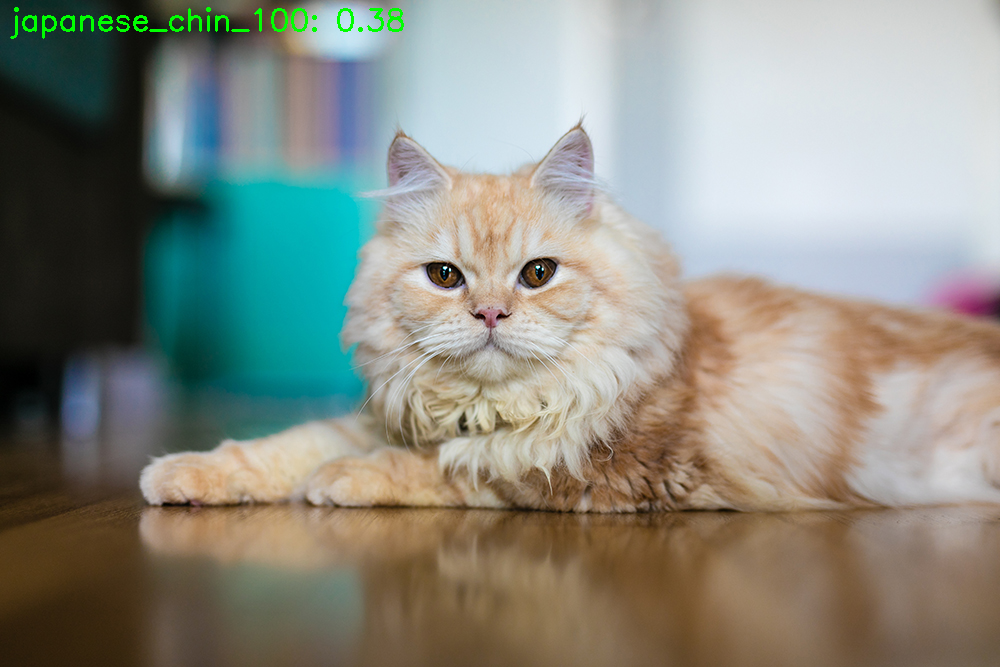

Image: /content/drive/MyDrive/Computer Vision/Final/images/cat1.jpg
Predicted Breed: japanese_chin_100, Confidence: 0.38
--------------------------------------------------
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


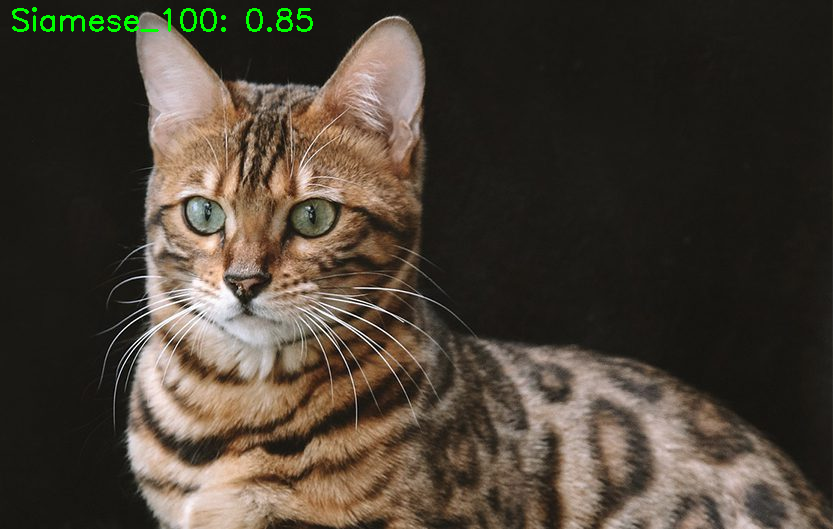

Image: /content/drive/MyDrive/Computer Vision/Final/images/cat2.jpg
Predicted Breed: Siamese_100, Confidence: 0.85
--------------------------------------------------
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


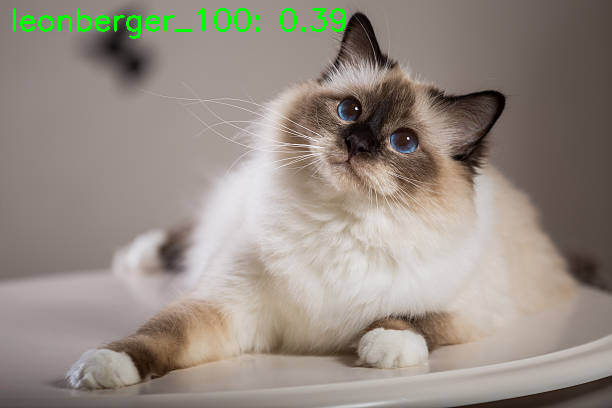

Image: /content/drive/MyDrive/Computer Vision/Final/images/cat3.jpg
Predicted Breed: leonberger_100, Confidence: 0.39
--------------------------------------------------
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


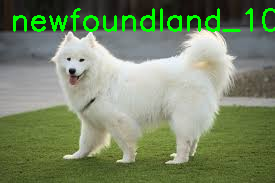

Image: /content/drive/MyDrive/Computer Vision/Final/images/dog1.jpg
Predicted Breed: newfoundland_100, Confidence: 0.99
--------------------------------------------------
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


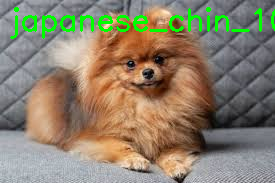

Image: /content/drive/MyDrive/Computer Vision/Final/images/dog2.jpg
Predicted Breed: japanese_chin_100, Confidence: 1.00
--------------------------------------------------
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


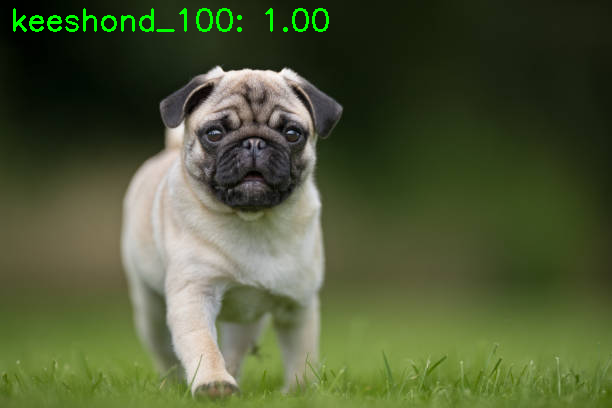

Image: /content/drive/MyDrive/Computer Vision/Final/images/dog3.jpg
Predicted Breed: keeshond_100, Confidence: 1.00
--------------------------------------------------

Testing model: VGG16
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


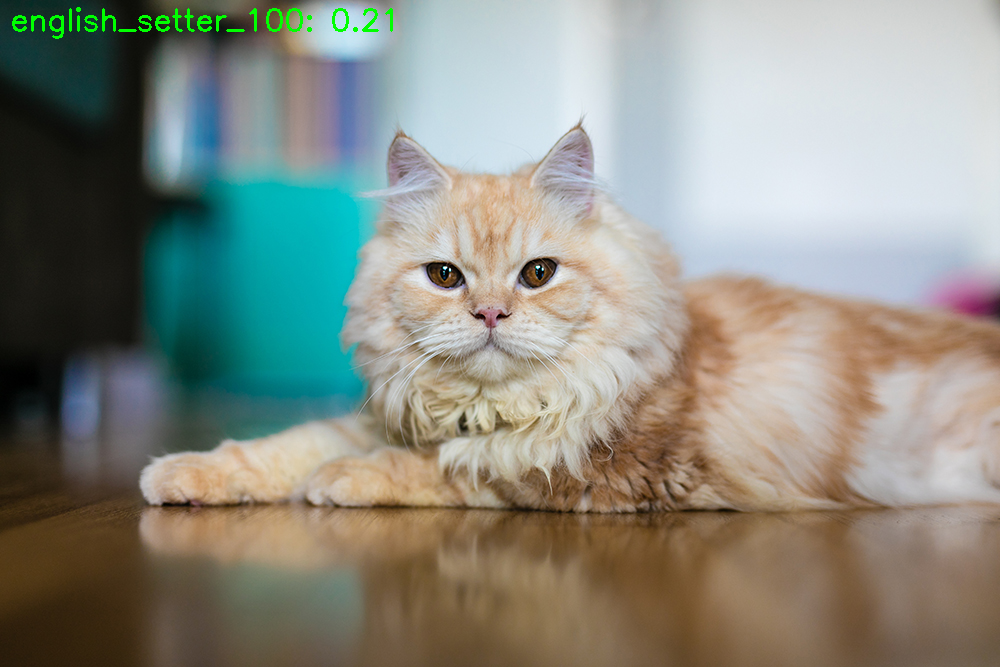

Image: /content/drive/MyDrive/Computer Vision/Final/images/cat1.jpg
Predicted Breed: english_setter_100, Confidence: 0.21
--------------------------------------------------
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


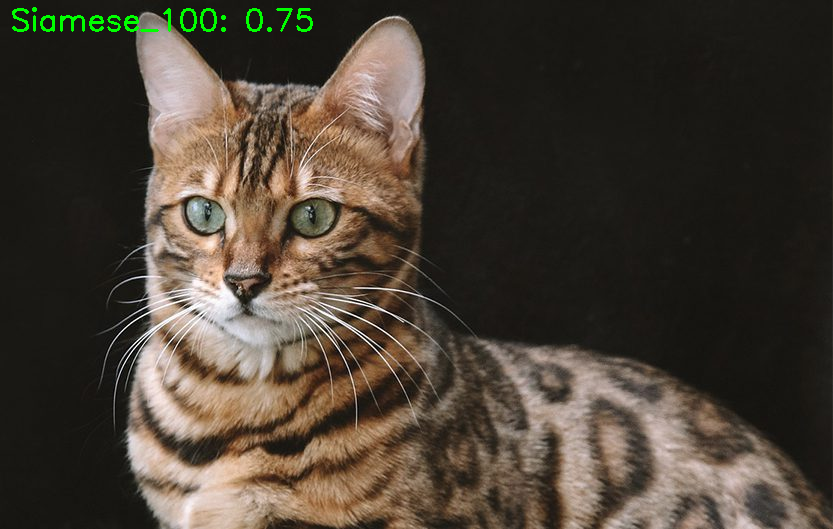

Image: /content/drive/MyDrive/Computer Vision/Final/images/cat2.jpg
Predicted Breed: Siamese_100, Confidence: 0.75
--------------------------------------------------
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


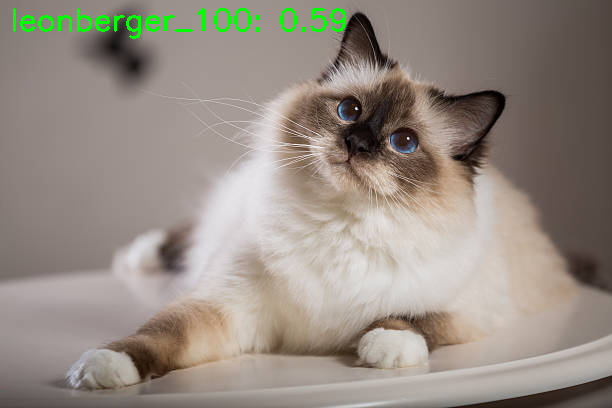

Image: /content/drive/MyDrive/Computer Vision/Final/images/cat3.jpg
Predicted Breed: leonberger_100, Confidence: 0.59
--------------------------------------------------
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


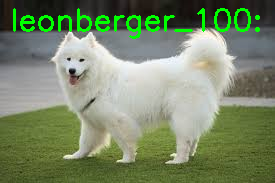

Image: /content/drive/MyDrive/Computer Vision/Final/images/dog1.jpg
Predicted Breed: leonberger_100, Confidence: 0.17
--------------------------------------------------
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


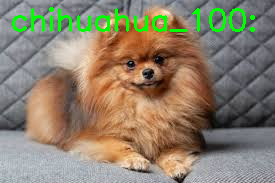

Image: /content/drive/MyDrive/Computer Vision/Final/images/dog2.jpg
Predicted Breed: chihuahua_100, Confidence: 0.28
--------------------------------------------------
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


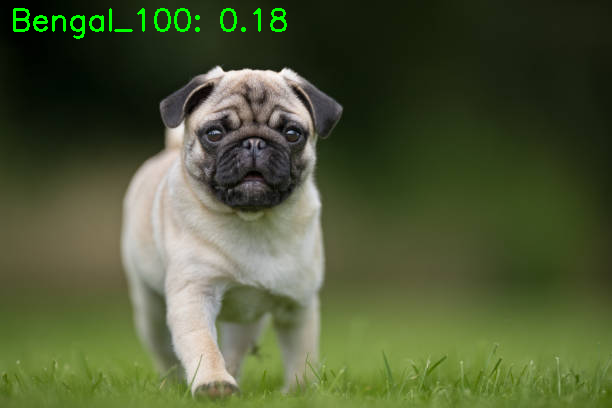

Image: /content/drive/MyDrive/Computer Vision/Final/images/dog3.jpg
Predicted Breed: Bengal_100, Confidence: 0.18
--------------------------------------------------

Testing model: VGG19
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


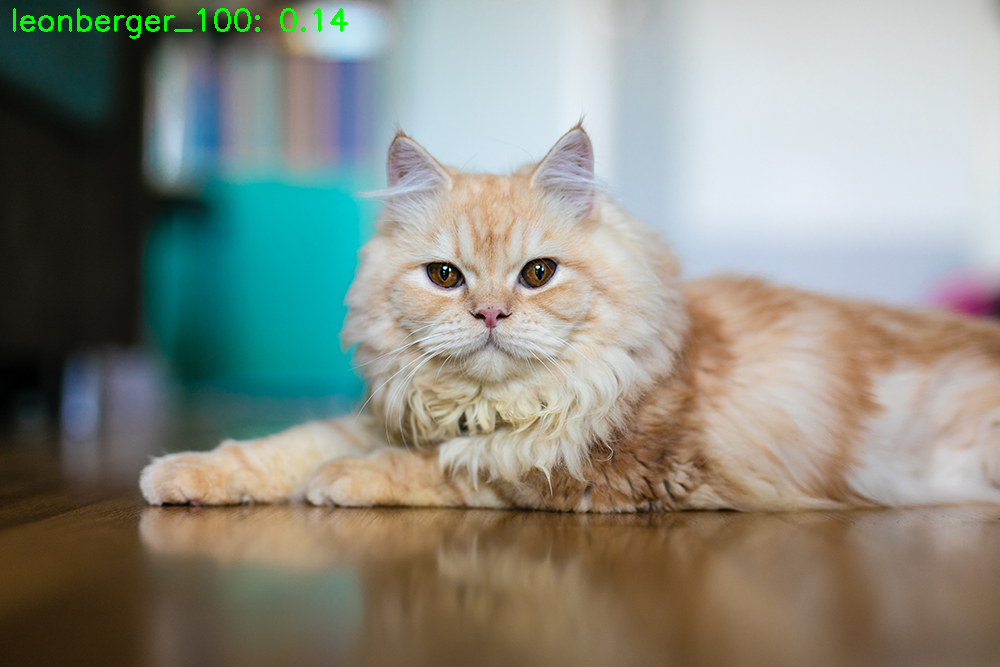

Image: /content/drive/MyDrive/Computer Vision/Final/images/cat1.jpg
Predicted Breed: leonberger_100, Confidence: 0.14
--------------------------------------------------
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


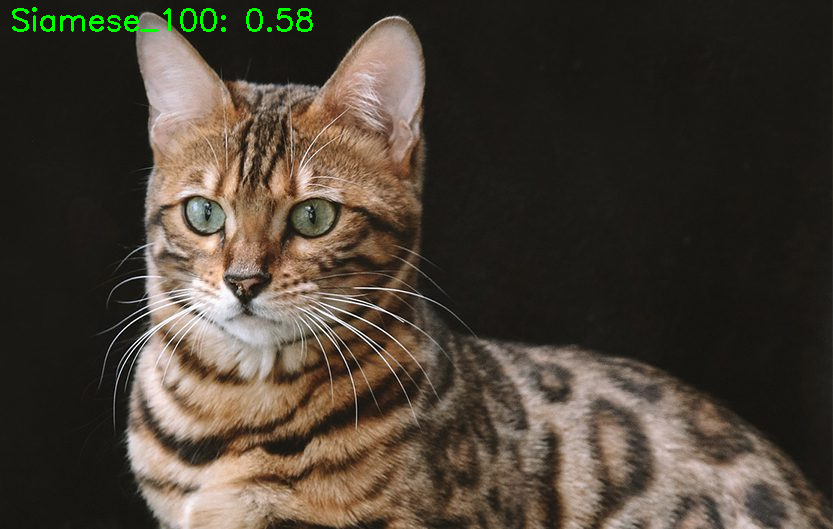

Image: /content/drive/MyDrive/Computer Vision/Final/images/cat2.jpg
Predicted Breed: Siamese_100, Confidence: 0.58
--------------------------------------------------
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


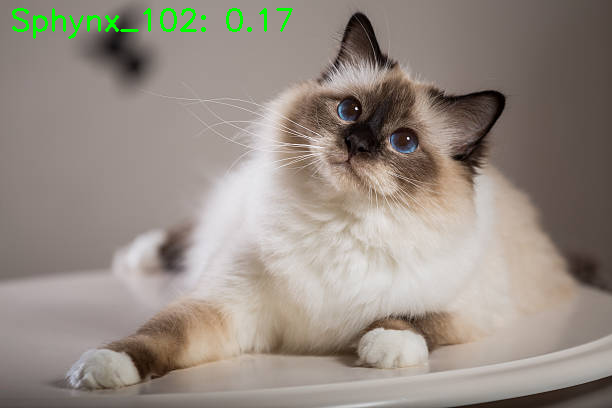

Image: /content/drive/MyDrive/Computer Vision/Final/images/cat3.jpg
Predicted Breed: Sphynx_102, Confidence: 0.17
--------------------------------------------------
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


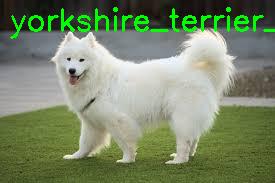

Image: /content/drive/MyDrive/Computer Vision/Final/images/dog1.jpg
Predicted Breed: yorkshire_terrier_100, Confidence: 0.11
--------------------------------------------------
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


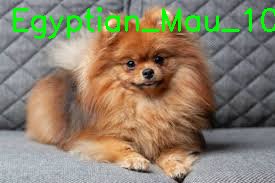

Image: /content/drive/MyDrive/Computer Vision/Final/images/dog2.jpg
Predicted Breed: Egyptian_Mau_100, Confidence: 0.17
--------------------------------------------------
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


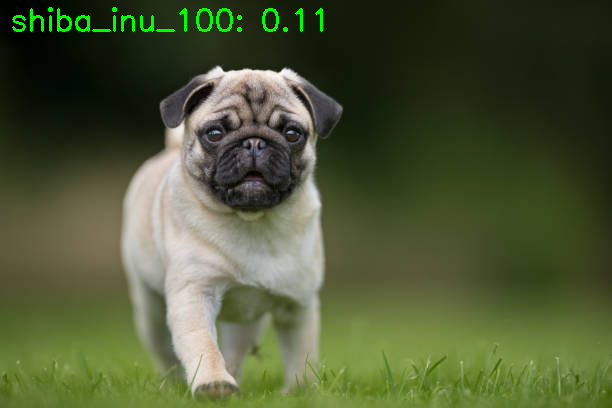

Image: /content/drive/MyDrive/Computer Vision/Final/images/dog3.jpg
Predicted Breed: shiba_inu_100, Confidence: 0.11
--------------------------------------------------

Testing model: ResNet50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


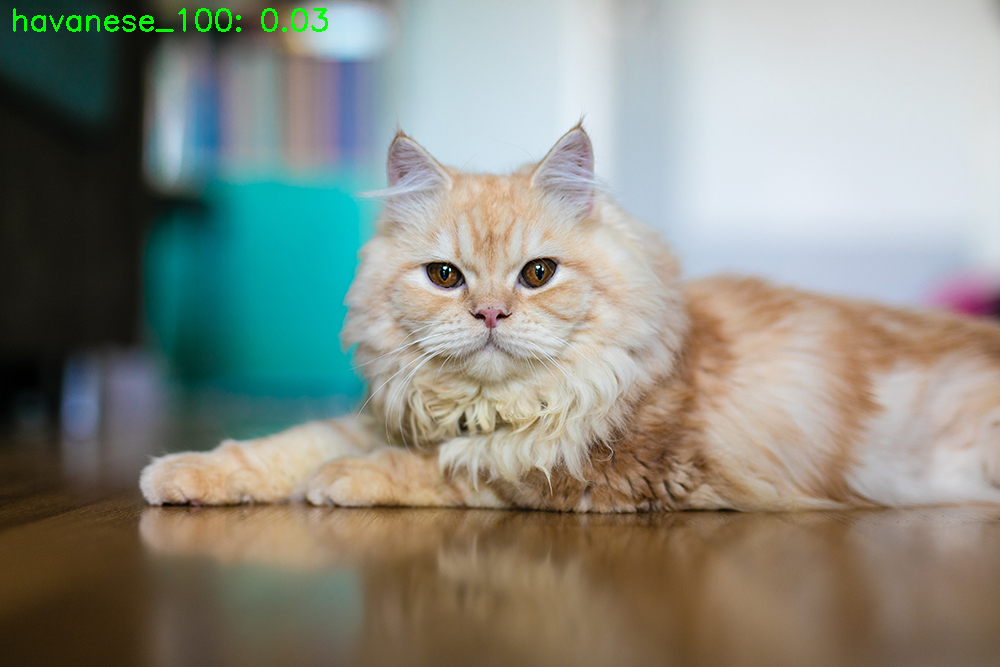

Image: /content/drive/MyDrive/Computer Vision/Final/images/cat1.jpg
Predicted Breed: havanese_100, Confidence: 0.03
--------------------------------------------------
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


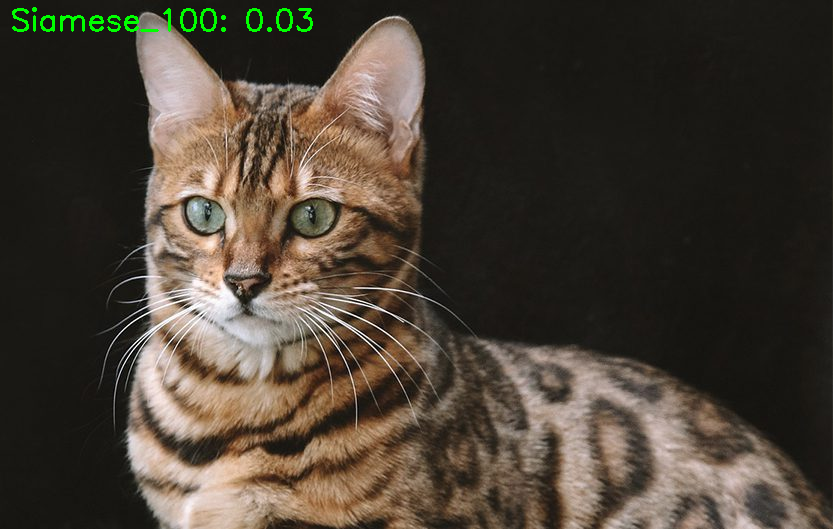

Image: /content/drive/MyDrive/Computer Vision/Final/images/cat2.jpg
Predicted Breed: Siamese_100, Confidence: 0.03
--------------------------------------------------
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


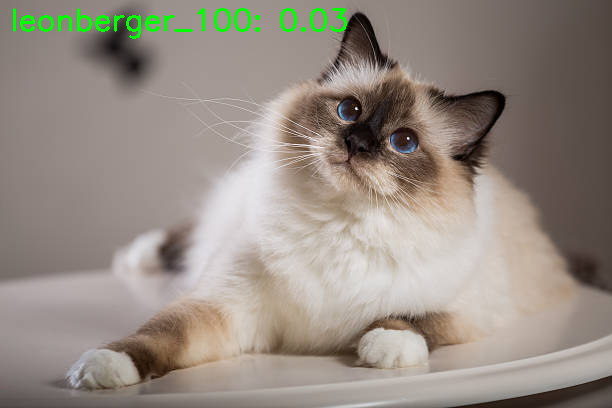

Image: /content/drive/MyDrive/Computer Vision/Final/images/cat3.jpg
Predicted Breed: leonberger_100, Confidence: 0.03
--------------------------------------------------
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


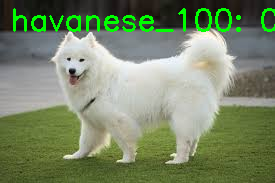

Image: /content/drive/MyDrive/Computer Vision/Final/images/dog1.jpg
Predicted Breed: havanese_100, Confidence: 0.03
--------------------------------------------------
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


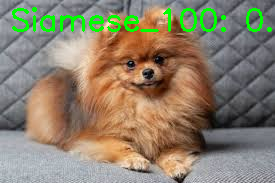

Image: /content/drive/MyDrive/Computer Vision/Final/images/dog2.jpg
Predicted Breed: Siamese_100, Confidence: 0.03
--------------------------------------------------
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


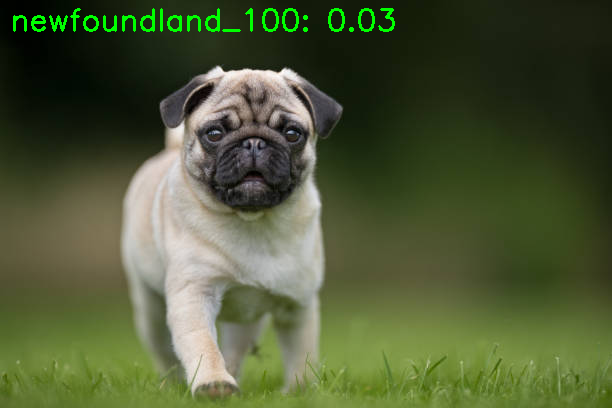

Image: /content/drive/MyDrive/Computer Vision/Final/images/dog3.jpg
Predicted Breed: newfoundland_100, Confidence: 0.03
--------------------------------------------------


In [ ]:
def prepare_image(image_path, target_size=(128, 128)):
    img = Image.open(image_path)
    img = img.resize(target_size)
    img_array = np.array(img) / 255.0 # to [0, 1]
    img_array = np.expand_dims(img_array, axis=0)  # Add batch dimension
    return img_array

for model_name, model_instance in models_to_test.items():
    print(f"\nTesting model: {model_name}")
    for image_path in image_paths:
        img = cv2.imread(image_path)
        img_resized = cv2.resize(img, IMG_SIZE)
        img_array = prepare_image(image_path)  # Use PIL preprocessing

        predictions = model_instance.predict(img_array)
        class_index = np.argmax(predictions)
        confidence = predictions[0][class_index]
        breed = [breed for breed, index in labels_dict.items() if index == class_index][0]

        # Display prediction using OpenCV
        cv2.putText(
            img, f"{breed}: {confidence:.2f}", (10, 30),
            cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 255, 0), 2
        )
        cv2_imshow(img)  # Use cv2_imshow in Colab
        print(f"Image: {image_path}")
        print(f"Predicted Breed: {breed}, Confidence: {confidence:.2f}")
        print("-" * 50)

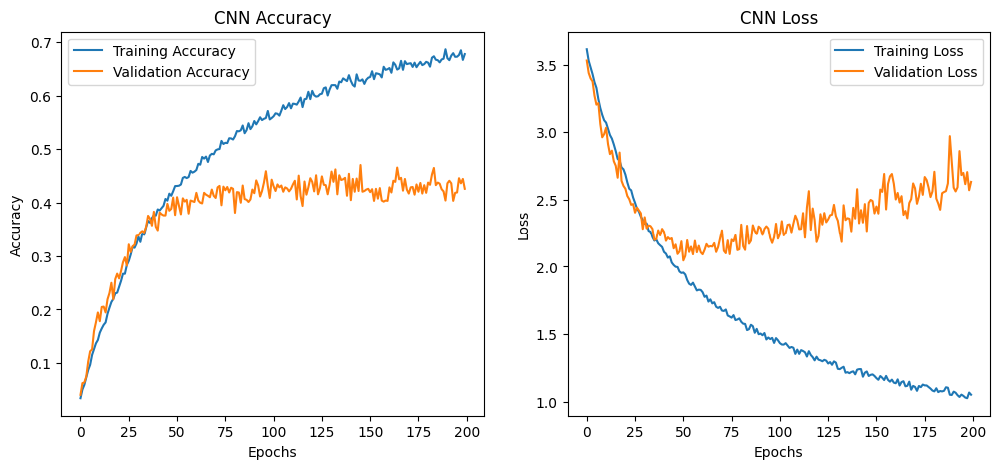

In [ ]:
# Plot CNN accuracy and loss
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.title('CNN Accuracy')

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('CNN Loss')
plt.show()

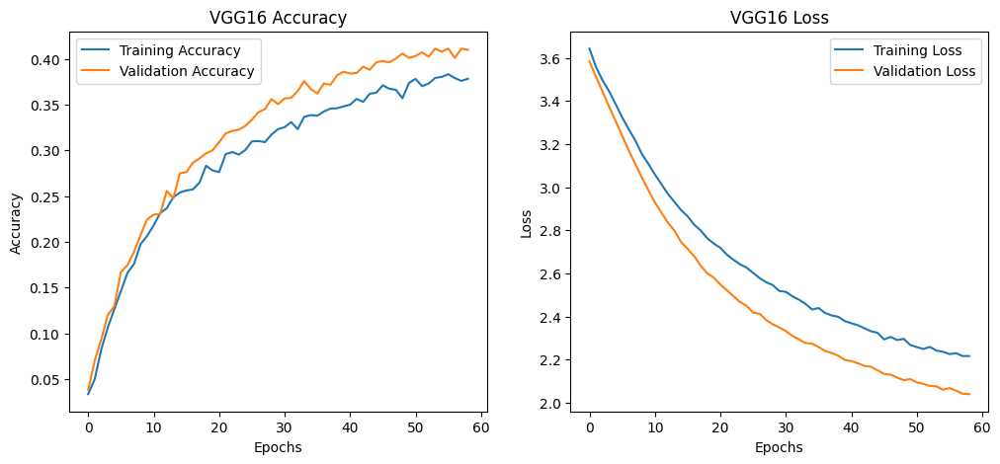

In [ ]:
# Plot VGG16 accuracy and loss
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(vgg16_history.history['accuracy'], label='Training Accuracy')
plt.plot(vgg16_history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.title('VGG16 Accuracy')

plt.subplot(1, 2, 2)
plt.plot(vgg16_history.history['loss'], label='Training Loss')
plt.plot(vgg16_history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('VGG16 Loss')
plt.show()

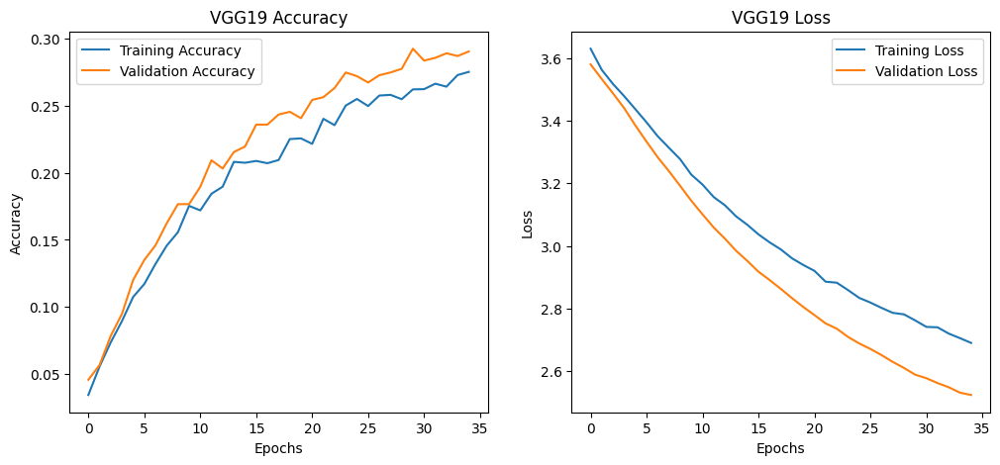

In [ ]:
# Plot VGG19 accuracy and loss
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(vgg19_history.history['accuracy'], label='Training Accuracy')
plt.plot(vgg19_history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.title('VGG19 Accuracy')

plt.subplot(1, 2, 2)
plt.plot(vgg19_history.history['loss'], label='Training Loss')
plt.plot(vgg19_history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('VGG19 Loss')
plt.show()

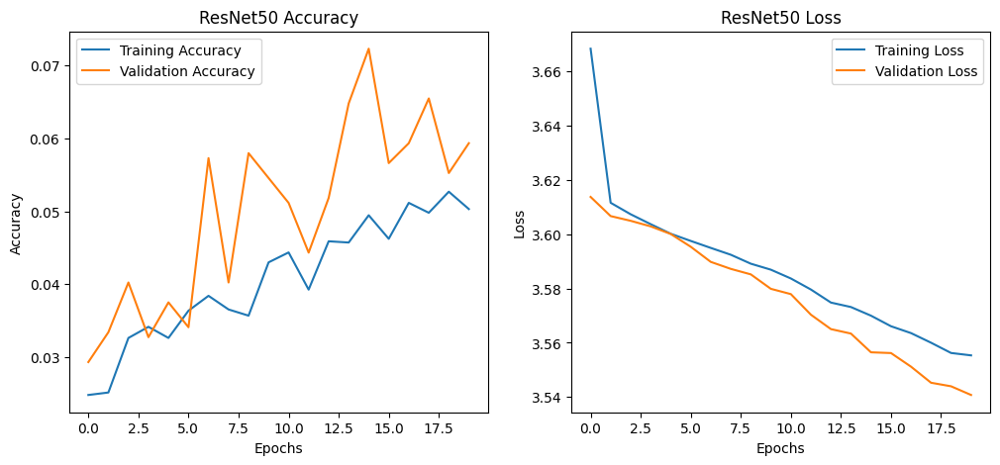

In [ ]:
# Plot ResNet50 accuracy and loss
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(resnet_history.history['accuracy'], label='Training Accuracy')
plt.plot(resnet_history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.title('ResNet50 Accuracy')

plt.subplot(1, 2, 2)
plt.plot(resnet_history.history['loss'], label='Training Loss')
plt.plot(resnet_history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('ResNet50 Loss')
plt.show()

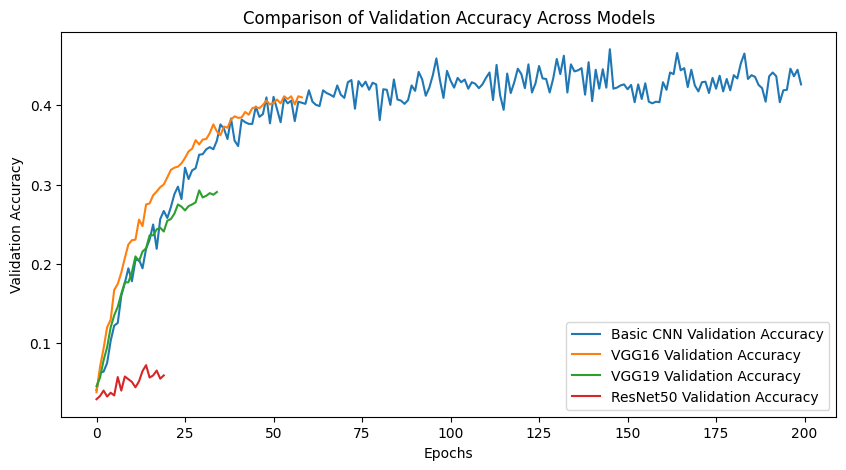

In [ ]:
# Compare validation accuracy of all models
plt.figure(figsize=(10, 5))
plt.plot(history.history['val_accuracy'], label='Basic CNN Validation Accuracy')
plt.plot(vgg16_history.history['val_accuracy'], label='VGG16 Validation Accuracy')
plt.plot(vgg19_history.history['val_accuracy'], label='VGG19 Validation Accuracy')
plt.plot(resnet_history.history['val_accuracy'], label='ResNet50 Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Validation Accuracy')
plt.legend()
plt.title('Comparison of Validation Accuracy Across Models')
plt.show()